The following series of 3 notebooks scrape rental postings from Craigslist from 4 neighborhoods in LA that we've identified as either gentrified, currently gentrifying, or could potentially gentrify in the future. The language from rental listings is then analyzed and compared to the rental prices in each of these neighborhoods. We hope to observe a relationship between the frequency of gentrification "code words" and rental prices. 

# Scraping Craiglist

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import bs4

In [2]:
# code by Audrey 
# this code was used to generate the csv files that are brought in in the following cells. 
def getPosts(neighborhood, howmany):
    postList = []
    n = neighborhood.replace(' ', '%20')
    
    # range 0 (1st page) - number of posts you want, going up in 120 increments 
    ## looping over the pages until you reach the target HOWMANY posts 
    for i in range(0, howmany, 120): 
    #FOR EACH PAGE: 
        url = f'https://losangeles.craigslist.org/d/housing/search/hhh?s={i}&query=' + n      
        #request the text from the url 
        r =requests.get(url)
        soup = BeautifulSoup(r.content)
        
        #get a list of posts 
        posts = soup.find_all('li', class_ = 'result-row')
        
        #FOR EACH POST 
        for post in posts:
            #store temporary variables 
            price = post.find('span', class_ = 'result-price')
            if price is not None: 
                price = price.text
            
            #break down housingsize into BR and SF 
            housingsize = post.find('span', class_ ='housing')
            bedrooms = None 
            sqft = None
            if housingsize is not None:
                housingsize = housingsize.text
                hlist = housingsize.split()
                
                for h in hlist:
                    if 'br' in h:
                        bedrooms = int(h.replace('br', ''))
                    if 'ft2' in h:
                        sqft = int(h.replace('ft2', ''))
                
            
            neighborhood = post.find('span', class_='result-hood')
            if neighborhood is not None: 
                neighborhood = neighborhood.text
                
            title = post.find('a', class_='result-title')
            if title is not None:
                title = title.text
            
            #go into the individual post's url and get the description...
            url_post = post.find('a', class_='result-title')['href']
            r_post = requests.get(url_post)
            soup_post = BeautifulSoup(r_post.content)
            description = soup_post.find('section', id="postingbody")
            
#             if "no parking" in soup_post.text.lower():
#                 noparking = True
#             elif "parking" in soup_object.text.lower():
#                 noparking = False
#             else:
#                 noparking = True
            
            latlon = soup_post.find('div', class_='viewposting')
            if latlon is not None:
                latitude = latlon['data-latitude']
                longitude = latlon['data-longitude']
            
            postList.append({'Post Title':title, 'Description':description, 'Neighborhood':neighborhood,'Price': price, 'No. Beds':bedrooms, 'SF':sqft, 'URL':url_post, 'lat': latitude, 'lon': longitude})
        
        df = pd.DataFrame(postList)
        
    return df

## East Hollywood

In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import PyPDF2
import re

In [ ]:
# this line of code is used to generate the df of listings in East Hollywood
# DON'T RUN THIS LINE AGAIN THE NEXT CELL HAS A GENERATED A CSV OF THE LISTINGS
east_holly = getPosts('East Hollywood', 1000)

In [3]:
east_holly = pd.read_csv('/Users/saratohamy/Desktop/University/Grad School/UCLA/Spring 2021 Quarter/UP229 – Urban Data Science/Group Project/eho_clist_df.csv')
east_holly.head()

,Unnamed: 0,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,0,Renovated East Hollywood Gem! 1BD/1BA with in ...,"<section id=""postingbody"">\n<div class=""print-...",(East Hollywood),"$2,095",1.0,850.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088924,-118.303436
1,1,Cozy Studio in East Hollywood,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,495",NaN,450.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.094440,-118.296209
2,2,East Hollywood Apartment 1 Bedroom 1 Bath,"<section id=""postingbody"">\n<div class=""print-...","(5154 Fountain Ave - 5154 1/4 Los Angeles, CA)","$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.090000,-118.294400
3,3,East Hollywood Spanish Studio Remodeled,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,295",NaN,440.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088891,-118.302097
4,4,East Hollywood Spanish Studio ALL UTILIITES,"<section id=""postingbody"">\n<div class=""print-...",(East Hollywood),"$1,495",NaN,475.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.091419,-118.297529


In [4]:
east_holly = east_holly[['Post Title','Description','Neighborhood','Price','No. Beds','SF','URL','lat','lon']]
east_holly.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,Renovated East Hollywood Gem! 1BD/1BA with in ...,"<section id=""postingbody"">\n<div class=""print-...",(East Hollywood),"$2,095",1.0,850.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088924,-118.303436
1,Cozy Studio in East Hollywood,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,495",NaN,450.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.094440,-118.296209
2,East Hollywood Apartment 1 Bedroom 1 Bath,"<section id=""postingbody"">\n<div class=""print-...","(5154 Fountain Ave - 5154 1/4 Los Angeles, CA)","$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.090000,-118.294400
3,East Hollywood Spanish Studio Remodeled,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,295",NaN,440.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088891,-118.302097
4,East Hollywood Spanish Studio ALL UTILIITES,"<section id=""postingbody"">\n<div class=""print-...",(East Hollywood),"$1,495",NaN,475.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.091419,-118.297529


In [10]:
# we want to get the description column into a list form
eholly_list = east_holly["Description"].tolist()
    
eholly_str = east_holly.Description.apply(str)
eholly_str = eholly_str.tolist()
eholly_text = re.sub(r"\s+", " ", str(eholly_str))
# turn it back into a string
eholly_str = str(eholly_str)

# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines_eholly = []                              # Declare an empty list
for line in eholly_list:                   # For each line of text,
    mylines_eholly.append(line)              # add that line to the list.
for element in mylines_eholly:               # For each element in the list,
    print(element)
    
# lets remove the white space from this
mylines_ehollytext = re.sub(r"\s+", " ", str(mylines_eholly))
mylines_ehollywords = re.sub(r"[^A-z\s]", "", mylines_ehollytext)
mylines_ehollywords



<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-renovated-east-hollywood/7326474230.html"></div>
</div>
<hr/>See better photos and <b>SCHEDULE A SHOWING</b> at:<br/><br/><big><b><u>http://showinghotline.com/lc/17926dc011</u></b></big><br/><br/>No, it's not a hyperlink.  :-(  You still have to copy-and-paste this link into the address bar on your web browser.<br/><hr/><br/><big>Renovated East Hollywood Gem! 1BD/1BA with in Unit Laundry &amp; Parking</big><br/><b>1020 N Kingsley Dr, Los Angeles, CA, 90029</b><br/><br/>$2095 per month<br/>Available now<br/>1 bed, 1 full bath<br/>850 sq. ft.<br/><br/><b>**Parking $100/mo***<br/></b><br/>If I had to guess, I’d say you like new shiny things. I’d go out on a limb and even suggest that you are in favor of a well-deigned kitchen with custom cabinets Bosch a

'[section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesrenovatedeasthollywoodhtmldiv\\ndiv\\nhrSee better photos and bSCHEDULE A SHOWINGb atbrbrbigbuhttpshowinghotlinecomlcdcubbigbrbrNo it\\s not a hyperlink  You still have to copyandpaste this link into the address bar on your web browserbrhrbrbigRenovated East Hollywood Gem BDBA with in Unit Laundry amp Parkingbigbrb N Kingsley Dr Los Angeles CA bbrbr per monthbrAvailable nowbr bed  full bathbr sq ftbrbrbParking mobrbbrIf I had to guess Id say you like new shiny things Id go out on a limb and even suggest that you are in favor of a welldeigned kitchen with custom cabinets Bosch appliances Sleekly designed bathrooms with spalike showers Thoughts on those How do you feel about designer lighting For it Id imagine brbr Well now that Ive gotten to know you so well have I got the place for yo

In [73]:
# lets do a raw word count that uses the standard stopwords list before adding to the stopwords
def count_words(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_ehollywords.split()
eholly_raw = count_words(wordlist)
eholly_raw.head(50)

,word_count
word,
district,2468
office,2096
apartments,1999
hollywood,1846
park,1758
space,1512
housing,1504
contact,1494
section,1456


Many of these words don't hold lots of signficance, but there are a few that do. "Office," "space," and "central" are just a few. But lets add some words to our stopwords list to get more meaningful results.  

In [30]:
# lets do a raw word count that uses the standard stopwords list before adding to the stopwords
def count_words_stopwords(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    swords.append('california')
    swords.append('space')
    swords.append('district')
    swords.append('apartments')
    swords.append('housing')
    swords.append('apartment')
    swords.append('month')
    swords.append('lease')
    swords.append('one')
    swords.append('bedroom')
    swords.append('homes')
    swords.append('select')
    swords.append('including')
    swords.append('available')
    swords.append('deposit')
    swords.append('st')
    swords.append('ca')
    swords.append('amp')
    swords.append('ca')
    swords.append('e')
    swords.append('located')
    swords.append('nd')
    swords.append('ave')
    swords.append('city')
    swords.append('section')
    swords.append('san')
    swords.append('contact')
    swords.append('unit')
    swords.append('square')
    swords.append('feet')
    swords.append('building')
    swords.append('p')
    swords.append('link')
    swords.append('rent')
    swords.append('classprintinformation')
    swords.append('printqrcodecontainer')
    swords.append('classprintqrcodelabelqr')
    swords.append('postp')
    swords.append('idpostingbody')
    swords.append('classprintqrcode')
    swords.append('hollywood')
    swords.append('south')
    swords.append('north')
    swords.append('east')
    swords.append('west')
    swords.append('hills')
    swords.append('highland')
    swords.append('el')
    swords.append('pasadena')
    swords.append('glendale')
    swords.append('area')
    swords.append('please')
    swords.append('heights')
    swords.append('may')
    swords.append('show')
    swords.append('street')
    swords.append('titleclick')
    swords.append('infoshow')
    swords.append('relnofollow')
    swords.append('classshowcontact')
    swords.append('href')
    swords.append('infoa')
    swords.append('auto')
    swords.append('heights')
    swords.append('santa')
    swords.append('datahrefreplylaxapa__service_id__')
    swords.append('home')
    swords.append('real')
    swords.append('dealer')
    swords.append('common')
    swords.append('subject')
    swords.append('location')
    swords.append('burbank')
    swords.append('dtla')
    swords.append('dealer')
    swords.append('nearby')
    swords.append('per')
    swords.append('information')
    swords.append('rock')
    swords.append('eagle')
    swords.append('us')
    swords.append('realty')
    swords.append('echo')
    swords.append('access')
    swords.append('lot')
    swords.append('downtown')
    swords.append('great')
    swords.append('rate')
    swords.append('floor')
    swords.append('terms')
    swords.append('year')
    swords.append('valley')
    swords.append('theres')
    swords.append('factor')
    swords.append('room')
    swords.append('theres')
    swords.append('call')
    swords.append('listed')
    swords.append('website')
    swords.append('andor')
    swords.append('disclosures')
    swords.append('guaranteed')
    swords.append('pico')
    swords.append('leases')
    swords.append('hill')
    swords.append('close')
    swords.append('monte')
    swords.append('lincoln')
    swords.append('huntington')
    swords.append('monterey')
    swords.append('union')
    swords.append('vernon')
    swords.append('listings')
    swords.append('center')
    swords.append('also')
    swords.append('core')
    swords.append('ktown')
    swords.append('rancho')
    swords.append('availability')
    swords.append('meet')
    swords.append('laguna')
    swords.append('see')
    swords.append('includes')
    swords.append('koreatown')
    swords.append('westlake')
    swords.append('arcadia')
    swords.append('rosemead')
    swords.append('printqrcodecontainer\np')
    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_ehollywords.split()
df = count_words_stopwords(wordlist)
df.head(50)

,word_count
word,
office,2096
park,1758
code,1052
central,1009
idpostingbody\ndiv,789
printqrcodecontainer\np,789
postp\ndiv,789
car,732
business,720


In [32]:
eholly_1000 = mylines_ehollywords.split()

# top 50 words
eholly_freq = countWords_nostop(eholly_1000)
eholly_freq_50 = eholly_freq.head(50)
eholly_freq_50

,word_count
word,
office,2096
park,1758
code,1052
central,1009
printqrcodecontainer\np,789
postp\ndiv,789
idpostingbody\ndiv,789
car,732
business,720


## Initial List of Gentrification Code Words
This first list of words was generated via a manual search for listings on various rental listing sites including apartments.com, craiglist.com, and hotpads.com. These words appeared several times across the sites and across our neighborhoods of interest. 

In [35]:
# list of code words to pull from the count of words
# code https://stackoverflow.com/questions/36410075/select-rows-from-a-dataframe-based-on-multiple-values-in-a-column-in-pandas
eholly_freq = eholly_freq.reset_index()
eholly_buzz = eholly_freq[eholly_freq['word'].isin(['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten'])]
eholly_buzz

,word,word_count
15,private,487
29,luxury,323
36,restaurants,303
57,walk,251
63,walking,239
67,gated,228
102,security,182
104,amenities,180
341,modern,101
408,prime,84


## Final List of Code Words
After more research and focusing in on the neighborhood descriptions provided by apartments.com, we settled on a more comprehensive list of gentrification code words that will be used for this project. The list of words is in the following cell. 

In [36]:
# lets find the frequency of the words that we identified from the descriptions of the neighborhoods from apartments.com to be common and an indication of gentrification
g_codes = ['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten', 'private', 'security', 'lounge', 'luxury', 'gated', 'modern', 'prime', 'central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool,' 'funky', 'landmark', 'historic', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors', 'affordable', 'upscale', 'leisure', 'budget', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors']
print("Frequency of Selected Keywords in East Hollywood")
eholly_freq = eholly_freq.reset_index()
eholly_g = eholly_freq[eholly_freq['word'].isin(g_codes)]
eholly_g['count_per_10posts'] = eholly_g['word_count']/len(east_holly)*10 #normalize by number of posts scraped 
eholly_g

Frequency of Selected Keywords in East Hollywood


<ipython-input-36-3a0fdf038f85>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eholly_g['count_per_10posts'] = eholly_g['word_count']/len(east_holly)*10 #normalize by number of posts scraped


,index,word,word_count,count_per_10posts
3,3,central,1009,12.788340
15,15,private,487,6.172370
18,18,historic,386,4.892269
29,29,luxury,323,4.093790
36,36,restaurants,303,3.840304
57,57,walk,251,3.181242
63,63,walking,239,3.029151
67,67,gated,228,2.889734
102,102,security,182,2.306717
104,104,amenities,180,2.281369


## Koreatown

In [38]:
ktown = pd.read_csv('/Users/saratohamy/Desktop/University/Grad School/UCLA/Spring 2021 Quarter/UP229 – Urban Data Science/Group Project/ktown_df.csv')
ktown.head()

,Unnamed: 0,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,0,Koreatown *Los Angeles 1 Br / 1 Ba available,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,700",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.068921,-118.293096
1,1,2 Bed/ 2 Bath Los Angeles **Koreatown**,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$2,300",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.066500,-118.302200
2,2,830 Crenshaw Blvd. #6 - Spacious 1be/1ba in Ko...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,650",1.0,725.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.058383,-118.321068
3,3,Where Koreatown Meets Downtown Los Angeles!,"<section id=""postingbody"">\n<div class=""print-...",NaN,"$2,935",1.0,830.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.076200,-118.302900
4,4,*2 bedroom/2 bathroom* Koreatown,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$2,300",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.068921,-118.293096


In [39]:
ktown = ktown[['Post Title','Description','Neighborhood','Price','No. Beds','SF','URL','lat','lon']]
ktown.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,Koreatown *Los Angeles 1 Br / 1 Ba available,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,700",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.068921,-118.293096
1,2 Bed/ 2 Bath Los Angeles **Koreatown**,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$2,300",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.066500,-118.302200
2,830 Crenshaw Blvd. #6 - Spacious 1be/1ba in Ko...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,650",1.0,725.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.058383,-118.321068
3,Where Koreatown Meets Downtown Los Angeles!,"<section id=""postingbody"">\n<div class=""print-...",NaN,"$2,935",1.0,830.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.076200,-118.302900
4,*2 bedroom/2 bathroom* Koreatown,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$2,300",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.068921,-118.293096


In [40]:
# this function cleans up the descriptions and puts them in the proper data type to conduct a word count
# tried this function but the type returns as a nonetype and won't convert to a string so i can't split it! I'll proceed without using a function.
def nbhood_df(neighborhood):
    df = pd.read_csv('/Users/saratohamy/Desktop/University/Grad School/UCLA/Spring 2021 Quarter/UP229 – Urban Data Science/Group Project/' +neighborhood+'_df.csv')
    df_list = df['Description'].tolist()
    df_str = df.Description.apply(str)
    df_text = re.sub(r"\s+", " ", str(df_str))
    mylines_df = []
    for line in df_list:
        mylines_df.append(line)
    for element in mylines_df:
        print(element)
    mylines_dftext = re.sub(r"\s+", " ", str(mylines_df))
    mylines_dfwords = re.sub(r"[^A-z\s]", "", mylines_dftext)

In [41]:
# we want to get the description column into a list form
ktown_list = ktown["Description"].tolist()
ktown_str = ktown.Description.apply(str)
ktown_text = re.sub(r"\s+", " ", str(ktown_str))

# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines_ktown = []                              # Declare an empty list
for line in ktown_list:                   # For each line of text,
    mylines_ktown.append(line)              # add that line to the list.
for element in mylines_ktown:               # For each element in the list,
    print(element)
    
# lets remove the white space from this
mylines_ktowntext = re.sub(r"\s+", " ", str(mylines_ktown))
mylines_ktownwords = re.sub(r"[^A-z\s]", "", mylines_ktowntext)
mylines_ktownwords

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-koreatown-los-angeles-br-ba/7326447486.html"></div>
</div>
- spacious Koreatown one bedroom one bathroom apartment<br/>
<br/>
- stainless steel appliances, granite counter tops, and tile floors<br/>
<br/>
- located off of 3rd and Vermont right in the heart of Koreatown<br/>
<br/>
- secure building with elevator, and gate code access<br/>
<br/>
- walking distance to bowling alley, Ralphs freeway<br/>
<br/>
- contact listing agent at  <a class="show-contact" data-href="/reply/lax/apa/7326447486/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show contact info</a>
 for showings    </section>
<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post<

'[section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangeleskoreatownlosangelesbrbahtmldiv\\ndiv\\n spacious Koreatown one bedroom one bathroom apartmentbr\\nbr\\n stainless steel appliances granite counter tops and tile floorsbr\\nbr\\n located off of rd and Vermont right in the heart of Koreatownbr\\nbr\\n secure building with elevator and gate code accessbr\\nbr\\n walking distance to bowling alley Ralphs freewaybr\\nbr\\n contact listing agent at a classshowcontact datahrefreplylaxapa__SERVICE_ID__ href relnofollow titleclick to show contact infoshow contact infoa\\n for showings section section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesbedbathlosangeleshtmldiv\\ndiv\\n spacious Koreatown 

In [42]:
type(mylines_ktownwords)

str

In [43]:
# lets do a raw word count that uses the standard stopwords list before adding to the stopwords
def count_words(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_ktownwords.split()
ktown_raw = count_words(wordlist)
ktown_raw.head(50)

,word_count
word,
br\n,2902
contact,2307
section,1817
apartments,1649
link,1146
code,1143
printqrcodecontainer\np,1080
classprintinformation,1080
postp\ndiv,1080


Interesting words from this list: "park," "new," "parking," and "steel"

In [44]:
# a function that does a word count for the string of descriptions

def countWords_nostop(wordlist):
    swords = stopwords.words('english')
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    swords.append('space')
    swords.append('district')
    swords.append('apartments')
    swords.append('housing')
    swords.append('apartment')
    swords.append('neighborhood')
    swords.append('month')
    swords.append('lease')
    swords.append('one')
    swords.append('bedroom')
    swords.append('homes')
    swords.append('select')
    swords.append('including')
    swords.append('available')
    swords.append('deposit')
    swords.append('st')
    swords.append('ca')
    swords.append('amp')
    swords.append('ca')
    swords.append('e')
    swords.append('located')
    swords.append('nd')
    swords.append('ave')
    swords.append('city')
    swords.append('section')
    swords.append('san')
    swords.append('contact')
    swords.append('unit')
    swords.append('square')
    swords.append('feet')
    swords.append('building')
    swords.append('p')
    swords.append('link')
    swords.append('rent')
    swords.append('classprintinformation')
    swords.append('printqrcodecontainer')
    swords.append('classprintqrcodelabelqr')
    swords.append('postp')
    swords.append('idpostingbody')
    swords.append('classprintqrcode')
    swords.append('hollywood')
    swords.append('south')
    swords.append('north')
    swords.append('east')
    swords.append('west')
    swords.append('hills')
    swords.append('highland')
    swords.append('el')
    swords.append('pasadena')
    swords.append('glendale')
    swords.append('area')
    swords.append('please')
    swords.append('heights')
    swords.append('may')
    swords.append('show')
    swords.append('street')
    swords.append('titleclick')
    swords.append('infoshow')
    swords.append('relnofollow')
    swords.append('classshowcontact')
    swords.append('href')
    swords.append('infoa')
    swords.append('auto')
    swords.append('heights')
    swords.append('santa')
    swords.append('datahrefreplylaxapa__service_id__')
    swords.append('home')
    swords.append('real')
    swords.append('dealer')
    swords.append('common')
    swords.append('subject')
    swords.append('location')
    swords.append('burbank')
    swords.append('dtla')
    swords.append('dealer')
    swords.append('nearby')
    swords.append('per')
    swords.append('information')
    swords.append('rock')
    swords.append('eagle')
    swords.append('us')
    swords.append('realty')
    swords.append('echo')
    swords.append('access')
    swords.append('lot')
    swords.append('downtown')
    swords.append('great')
    swords.append('rate')
    swords.append('floor')
    swords.append('terms')
    swords.append('year')
    swords.append('valley')
    swords.append('theres')
    swords.append('factor')
    swords.append('room')
    swords.append('theres')
    swords.append('call')
    swords.append('listed')
    swords.append('website')
    swords.append('andor')
    swords.append('disclosures')
    swords.append('guaranteed')
    swords.append('pico')
    swords.append('leases')
    swords.append('hill')
    swords.append('close')
    swords.append('monte')
    swords.append('lincoln')
    swords.append('huntington')
    swords.append('monterey')
    swords.append('union')
    swords.append('vernon')
    swords.append('listings')
    swords.append('center')
    swords.append('also')
    swords.append('core')
    swords.append('ktown')
    swords.append('rancho')
    swords.append('availability')
    swords.append('meet')
    swords.append('laguna')
    swords.append('see')
    swords.append('includes')
    swords.append('koreatown')
    swords.append('westlake')
    swords.append('arcadia')
    swords.append('rosemead')
    swords.append('br\n')
    swords.append('code')
    swords.append('printqrcodecontainer\np')
    swords.append('postp\ndiv')
    swords.append('printqrcodecontainer\np')
    swords.append('idpostingbody\ndiv')
    swords.append('fidm')
    swords.append('amenitiesbr\n')

    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower()
        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_ktownwords.split()
df = countWords_nostop(wordlist)
print(df.head())

                         word_count
word                               
br\n                           2902
idpostingbody\ndiv             1080
printqrcodecontainer\np        1080
postp\ndiv                     1080
park                            866


In [45]:
ktown_1000 = mylines_ktownwords.split()

# top 50 words
ktown_freq = countWords_nostop(ktown_1000)
ktown_freq_50 = ktown_freq.head(50)
ktown_freq_50

,word_count
word,
br\n,2902
idpostingbody\ndiv,1080
printqrcodecontainer\np,1080
postp\ndiv,1080
park,866
central,698
new,622
pet,567
laundry,508


We already see more meaningful results. Words that are related to geographic location, size of unit, and physical amenities (like stainless steel appliances seem to really be emphasized, as opposed to neighborhood characteristics. 

In [46]:
# lets find the frequency of the words that we identified from the descriptions of the neighborhoods from apartments.com to be common and an indication of gentrification
g_codes = ['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten', 'private', 'security', 'lounge', 'luxury', 'gated', 'modern', 'prime', 'central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool,' 'funky', 'landmark', 'historic', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors', 'affordable', 'upscale', 'leisure', 'budget', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors']
print("Frequency of Selected Keywords in Koreatown")
ktown_freq = ktown_freq.reset_index()
ktown_g = ktown_freq[ktown_freq['word'].isin(g_codes)]
ktown_g['count_per_10posts'] = ktown_g['word_count']/len(ktown)*10 #normalize by number of posts scraped 
ktown_g

Frequency of Selected Keywords in Koreatown


<ipython-input-46-38bb6caec7ae>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ktown_g['count_per_10posts'] = ktown_g['word_count']/len(ktown)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
5,central,698,6.462963
25,gated,305,2.824074
26,amenities,304,2.814815
37,private,257,2.379630
38,restaurants,249,2.305556
43,luxury,231,2.138889
52,security,212,1.962963
55,walking,210,1.944444
85,walk,172,1.592593
107,historic,148,1.370370


In [21]:
ktown_g = ktown_g[['word','word_count','count_per_10posts']]
ktown_g

,word,word_count,count_per_10posts
5,central,698,6.462963
25,gated,305,2.824074
26,amenities,304,2.814815
37,private,257,2.379630
38,restaurants,249,2.305556
43,luxury,231,2.138889
52,security,212,1.962963
55,walking,210,1.944444
85,walk,172,1.592593
107,historic,148,1.370370


## Highland Park

In [47]:
hpark = pd.read_csv('/Users/saratohamy/Desktop/University/Grad School/UCLA/Spring 2021 Quarter/UP229 – Urban Data Science/Group Project/hpark_df.csv')
hpark.head()

,Unnamed: 0,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,0,"BEAUTIFUL, LARGE AND BRIGHT 1 BED 1 BATH - HIG...","<section id=""postingbody"">\n<div class=""print-...","(MOVE IN SPECIAL, 3rd MONTH FREE RENT!!!)","$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.099532,-118.204403
1,1,REMODELED 1+1 in Highland Park With Wood Style...,"<section id=""postingbody"">\n<div class=""print-...",(Highland Park),"$1,850",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.103609,-118.194491
2,2,"1+1 in Highland Park, Central Air, Pet-Friendl...","<section id=""postingbody"">\n<div class=""print-...",(Highland Park/Eagle Rock),"$2,000",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405
3,3,"Wood Style Floors, Central Air, Renovated 1 Be...","<section id=""postingbody"">\n<div class=""print-...",NaN,"$2,000",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405
4,4,Washer/Dryer in Unit!!! JR. 1 Bedroom in PRIME...,"<section id=""postingbody"">\n<div class=""print-...",(Highland Park),"$1,795",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.111751,-118.194759


In [48]:
hpark = hpark[['Post Title','Description','Neighborhood','Price','No. Beds','SF','URL','lat','lon']]
hpark.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,"BEAUTIFUL, LARGE AND BRIGHT 1 BED 1 BATH - HIG...","<section id=""postingbody"">\n<div class=""print-...","(MOVE IN SPECIAL, 3rd MONTH FREE RENT!!!)","$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.099532,-118.204403
1,REMODELED 1+1 in Highland Park With Wood Style...,"<section id=""postingbody"">\n<div class=""print-...",(Highland Park),"$1,850",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.103609,-118.194491
2,"1+1 in Highland Park, Central Air, Pet-Friendl...","<section id=""postingbody"">\n<div class=""print-...",(Highland Park/Eagle Rock),"$2,000",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405
3,"Wood Style Floors, Central Air, Renovated 1 Be...","<section id=""postingbody"">\n<div class=""print-...",NaN,"$2,000",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405
4,Washer/Dryer in Unit!!! JR. 1 Bedroom in PRIME...,"<section id=""postingbody"">\n<div class=""print-...",(Highland Park),"$1,795",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.111751,-118.194759


In [49]:
# we want to get the description column into a list form
hpark_list = hpark["Description"].tolist()
hpark_str = hpark.Description.apply(str)
hpark_text = re.sub(r"\s+", " ", str(hpark_str))

# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines_hpark = []                              # Declare an empty list
for line in hpark_list:                   # For each line of text,
    mylines_hpark.append(line)              # add that line to the list.
for element in mylines_hpark:               # For each element in the list,
    print(element)
    
# lets remove the white space from this
mylines_hparktext = re.sub(r"\s+", " ", str(mylines_hpark))
mylines_hparkwords = re.sub(r"[^A-z\s]", "", mylines_hparktext)
mylines_hparkwords

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-beautiful-large-and-bright/7314940327.html"></div>
</div>
MOVE IN SPECIAL, 3rd MONTH FREE RENT!!!<br/>
<br/>
THIS APARTMENT IS A CHARMING, COZY AND HOME WARMING, 1 BED 1 BATH APT. LOCATED NEAR HIGHLAND PARK!!!<br/>
THE APARTMENT FEATURES HARDWOOD FLOORING THROUGHOUT, ELEGANT TILES IN THE KITCHEN, LOTS OF NATURAL LIGHT AND WAS FRESHLY PAINTED FOR A BRIGHTER EXPERIENCE.<br/>
<br/>
APARTMENT FEATURES:<br/>
*STOVE/OVEN*<br/>
*REFRIGERATOR*<br/>
*FRESHLY PAINTED*<br/>
*BRAND NEW MODERN LIGHT FIXTURES WITH CEILING FANS*<br/>
*PARQUET WOOD FLOORING THROUGHOUT WITH ELEGANT TILES IN KITCHEN*<br/>
*GREAT CLOSET SPACE*<br/>
*LOTS OF KITCHEN CABINET SPACE*<br/>
<br/>
<br/>
BUILDING FEATURES:<br/>
*WASH AND DRYER ON SITE*<br/>
<br/>
<br/>
UTILITIES:<br/>
WATER AND

'[section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesbeautifullargeandbrighthtmldiv\\ndiv\\nMOVE IN SPECIAL rd MONTH FREE RENTbr\\nbr\\nTHIS APARTMENT IS A CHARMING COZY AND HOME WARMING  BED  BATH APT LOCATED NEAR HIGHLAND PARKbr\\nTHE APARTMENT FEATURES HARDWOOD FLOORING THROUGHOUT ELEGANT TILES IN THE KITCHEN LOTS OF NATURAL LIGHT AND WAS FRESHLY PAINTED FOR A BRIGHTER EXPERIENCEbr\\nbr\\nAPARTMENT FEATURESbr\\nSTOVEOVENbr\\nREFRIGERATORbr\\nFRESHLY PAINTEDbr\\nBRAND NEW MODERN LIGHT FIXTURES WITH CEILING FANSbr\\nPARQUET WOOD FLOORING THROUGHOUT WITH ELEGANT TILES IN KITCHENbr\\nGREAT CLOSET SPACEbr\\nLOTS OF KITCHEN CABINET SPACEbr\\nbr\\nbr\\nBUILDING FEATURESbr\\nWASH AND DRYER ON SITEbr\\nbr\\nbr\\nUTILITIESbr\\nWATER AND TRASH INCLUDEDbr\\nbr\\nbr\\nPARKING INCLUDEDbr\\nbr\\nbr\\n North Figueroa Street has a Walk Score of  out 

In [50]:
# lets do a raw word count that uses the standard stopwords list before adding to the stopwords
def count_words(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_hparkwords.split()
hpark_raw = count_words(wordlist)
hpark_raw.head(50)

,word_count
word,
park,1917
district,1511
section,1128
space,1093
contact,1060
city,1019
san,1011
code,804
unit,746


Interesting words: "space," "car," and "beach"

In [51]:
# a function that does a word count for the string of descriptions

def countWords_nostop(wordlist):
    swords = stopwords.words('english')
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    swords.append('space')
    swords.append('district')
    swords.append('apartments')
    swords.append('housing')
    swords.append('apartment')
    swords.append('neighborhood')
    swords.append('month')
    swords.append('lease')
    swords.append('one')
    swords.append('bedroom')
    swords.append('homes')
    swords.append('select')
    swords.append('including')
    swords.append('available')
    swords.append('deposit')
    swords.append('st')
    swords.append('ca')
    swords.append('amp')
    swords.append('ca')
    swords.append('e')
    swords.append('located')
    swords.append('nd')
    swords.append('ave')
    swords.append('city')
    swords.append('section')
    swords.append('san')
    swords.append('contact')
    swords.append('unit')
    swords.append('square')
    swords.append('feet')
    swords.append('building')
    swords.append('p')
    swords.append('link')
    swords.append('rent')
    swords.append('classprintinformation')
    swords.append('printqrcodecontainer')
    swords.append('classprintqrcodelabelqr')
    swords.append('postp')
    swords.append('idpostingbody')
    swords.append('classprintqrcode')
    swords.append('hollywood')
    swords.append('south')
    swords.append('north')
    swords.append('east')
    swords.append('west')
    swords.append('hills')
    swords.append('highland')
    swords.append('el')
    swords.append('pasadena')
    swords.append('glendale')
    swords.append('area')
    swords.append('please')
    swords.append('heights')
    swords.append('may')
    swords.append('show')
    swords.append('street')
    swords.append('titleclick')
    swords.append('infoshow')
    swords.append('relnofollow')
    swords.append('classshowcontact')
    swords.append('href')
    swords.append('infoa')
    swords.append('auto')
    swords.append('heights')
    swords.append('santa')
    swords.append('datahrefreplylaxapa__service_id__')
    swords.append('home')
    swords.append('real')
    swords.append('dealer')
    swords.append('common')
    swords.append('subject')
    swords.append('location')
    swords.append('burbank')
    swords.append('dtla')
    swords.append('dealer')
    swords.append('nearby')
    swords.append('per')
    swords.append('information')
    swords.append('rock')
    swords.append('eagle')
    swords.append('us')
    swords.append('realty')
    swords.append('echo')
    swords.append('access')
    swords.append('lot')
    swords.append('downtown')
    swords.append('great')
    swords.append('rate')
    swords.append('floor')
    swords.append('terms')
    swords.append('year')
    swords.append('valley')
    swords.append('theres')
    swords.append('factor')
    swords.append('room')
    swords.append('theres')
    swords.append('call')
    swords.append('listed')
    swords.append('website')
    swords.append('andor')
    swords.append('disclosures')
    swords.append('guaranteed')
    swords.append('pico')
    swords.append('leases')
    swords.append('hill')
    swords.append('close')
    swords.append('monte')
    swords.append('lincoln')
    swords.append('huntington')
    swords.append('monterey')
    swords.append('union')
    swords.append('vernon')
    swords.append('listings')
    swords.append('center')
    swords.append('also')
    swords.append('core')
    swords.append('ktown')
    swords.append('rancho')
    swords.append('availability')
    swords.append('meet')
    swords.append('laguna')
    swords.append('see')
    swords.append('includes')
    swords.append('koreatown')
    swords.append('westlake')
    swords.append('arcadia')
    swords.append('rosemead')
    swords.append('br\n')
    swords.append('code')
    swords.append('printqrcodecontainer\np')
    swords.append('postp\ndiv')
    swords.append('printqrcodecontainer\np')
    swords.append('idpostingbody\ndiv')
    swords.append('fidm')
    swords.append('amenitiesbr\n')
    # add 'park' to this list since we're working with Highland Park
    swords.append('park')

    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower()
        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_hparkwords.split()
df = countWords_nostop(wordlist)
print(df.head())

                         word_count
word                               
car                             703
printqrcodecontainer\np         662
postp\ndiv                      662
idpostingbody\ndiv              662
beach                           558


In [52]:
hpark_1000 = mylines_hparkwords.split()

# top 50 words
hpark_freq = countWords_nostop(hpark_1000)
hpark_freq_50 = hpark_freq.head(50)
hpark_freq_50

,word_count
word,
car,703
printqrcodecontainer\np,662
postp\ndiv,662
idpostingbody\ndiv,662
beach,558
lake,486
retail,440
parking,383
office,350


In [53]:
# lets find the frequency of the words that we identified from the descriptions of the neighborhoods from apartments.com to be common and an indication of gentrification
g_codes = ['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten', 'private', 'security', 'lounge', 'luxury', 'gated', 'modern', 'prime', 'central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool' 'funky', 'landmark', 'historic', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors', 'affordable', 'upscale', 'leisure', 'budget', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors']
print("Frequency of Selected Keywords in Highland Park")
hpark_freq = hpark_freq.reset_index()
hpark_g = hpark_freq[hpark_freq['word'].isin(g_codes)]
hpark_g['count_per_10posts'] = hpark_g['word_count']/len(hpark)*10 #normalize by number of posts scraped 
hpark_g

Frequency of Selected Keywords in Highland Park


<ipython-input-53-d38be604e001>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hpark_g['count_per_10posts'] = hpark_g['word_count']/len(hpark)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
9,central,344,5.196375
13,private,283,4.274924
17,historic,254,3.836858
34,walk,197,2.975831
64,restaurants,167,2.522659
76,security,159,2.401813
103,gated,145,2.190332
115,modern,141,2.129909
223,amenities,106,1.601208
238,art,99,1.495468


## Boyle Heights

In [55]:
bheights = pd.read_csv('/Users/saratohamy/Desktop/University/Grad School/UCLA/Spring 2021 Quarter/UP229 – Urban Data Science/Group Project/bheights_df.csv')
bheights.head()

,Unnamed: 0,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,0,Well kept 6 units in Prime Boyle Heights - 40%...,"<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights/Los Angeles),"$1,650,000",NaN,NaN,https://losangeles.craigslist.org/wst/reb/d/lo...,34.048700,-118.208400
1,1,A Newly Remodeled Boyle Heights Community - ON...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.048700,-118.208400
2,2,Newly Remodeled Large 1 Bed + 1 Bath located i...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,395",1.0,NaN,https://losangeles.craigslist.org/wst/apa/d/lo...,34.044188,-118.206152
3,3,"Modern Studio in Boyle Heights, Newly Renovated","<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights),"$1,295",NaN,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.042690,-118.216412
4,4,On The Other Side Of Downtown Is The Authentic...,"<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights),"$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.053238,-118.196660


In [56]:
bheights = bheights[['Post Title','Description','Neighborhood','Price','No. Beds','SF','URL','lat','lon']]
bheights.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,Well kept 6 units in Prime Boyle Heights - 40%...,"<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights/Los Angeles),"$1,650,000",NaN,NaN,https://losangeles.craigslist.org/wst/reb/d/lo...,34.048700,-118.208400
1,A Newly Remodeled Boyle Heights Community - ON...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.048700,-118.208400
2,Newly Remodeled Large 1 Bed + 1 Bath located i...,"<section id=""postingbody"">\n<div class=""print-...",(Los Angeles),"$1,395",1.0,NaN,https://losangeles.craigslist.org/wst/apa/d/lo...,34.044188,-118.206152
3,"Modern Studio in Boyle Heights, Newly Renovated","<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights),"$1,295",NaN,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.042690,-118.216412
4,On The Other Side Of Downtown Is The Authentic...,"<section id=""postingbody"">\n<div class=""print-...",(Boyle Heights),"$1,550",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.053238,-118.196660


In [57]:
# we want to get the description column into a list form
bheights_list = bheights["Description"].tolist()
bheights_str = bheights.Description.apply(str)
bheights_text = re.sub(r"\s+", " ", str(bheights_str))

# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines_bheights = []                              # Declare an empty list
for line in bheights_list:                   # For each line of text,
    mylines_bheights.append(line)              # add that line to the list.
for element in mylines_bheights:               # For each element in the list,
    print(element)
    
# lets remove the white space from this
mylines_bheightstext = re.sub(r"\s+", " ", str(mylines_bheights))
mylines_bheightswords = re.sub(r"[^A-z\s]", "", mylines_bheightstext)
mylines_bheightswords

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/wst/reb/d/los-angeles-well-kept-units-in-prime/7313126654.html"></div>
</div>
Well kept 6 units in Prime Boyle Heights - 40% UPSIDE IN RENTS<br/>
<br/>
For more information about this listing and to view all properties in the area for free, please visit my website at: <br/>
www.ips-la.com<br/>
<br/>
Gabriela Manakova <br/>
INNOVATIVE Property Strategies<br/>
Local Real Estate Expert<br/>
<a class="show-contact" data-href="/reply/lax/reb/7313126654/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show contact info</a>
<br/>
DRE# 01327946    </section>
<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangele

'[section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorgwstrebdlosangeleswellkeptunitsinprimehtmldiv\\ndiv\\nWell kept  units in Prime Boyle Heights   UPSIDE IN RENTSbr\\nbr\\nFor more information about this listing and to view all properties in the area for free please visit my website at br\\nwwwipslacombr\\nbr\\nGabriela Manakova br\\nINNOVATIVE Property Strategiesbr\\nLocal Real Estate Expertbr\\na classshowcontact datahrefreplylaxreb__SERVICE_ID__ href relnofollow titleclick to show contact infoshow contact infoa\\nbr\\nDRE  section section idpostingbody\\ndiv classprintinformation printqrcodecontainer\\np classprintqrcodelabelQR Code Link to This Postp\\ndiv classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesnewlyremodeledboylehtmldiv\\ndiv\\nCome home to Azure Heights This newly renovated building is designed with convenience 

In [58]:
# lets do a raw word count that uses the standard stopwords list before adding to the stopwords
def count_words(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_bheightswords.split()
bheights_raw = count_words(wordlist)
bheights_raw.head(50)

,word_count
word,
district,1744
space,1136
park,1005
building,713
square,709
feet,703
section,587
heights,576
lease,546


Interesting words: "fashion," "parking," and "historic"

In [59]:
# a function that does a word count for the string of descriptions

def countWords_nostop(wordlist):
    swords = stopwords.words('english')
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    swords.append('space')
    swords.append('district')
    swords.append('apartments')
    swords.append('housing')
    swords.append('apartment')
    swords.append('neighborhood')
    swords.append('month')
    swords.append('lease')
    swords.append('one')
    swords.append('bedroom')
    swords.append('homes')
    swords.append('select')
    swords.append('including')
    swords.append('available')
    swords.append('deposit')
    swords.append('st')
    swords.append('ca')
    swords.append('amp')
    swords.append('ca')
    swords.append('e')
    swords.append('located')
    swords.append('nd')
    swords.append('ave')
    swords.append('city')
    swords.append('section')
    swords.append('san')
    swords.append('contact')
    swords.append('unit')
    swords.append('square')
    swords.append('feet')
    swords.append('building')
    swords.append('p')
    swords.append('link')
    swords.append('rent')
    swords.append('classprintinformation')
    swords.append('printqrcodecontainer')
    swords.append('classprintqrcodelabelqr')
    swords.append('postp')
    swords.append('idpostingbody')
    swords.append('classprintqrcode')
    swords.append('hollywood')
    swords.append('south')
    swords.append('north')
    swords.append('east')
    swords.append('west')
    swords.append('hills')
    swords.append('highland')
    swords.append('el')
    swords.append('pasadena')
    swords.append('glendale')
    swords.append('area')
    swords.append('please')
    swords.append('heights')
    swords.append('may')
    swords.append('show')
    swords.append('street')
    swords.append('titleclick')
    swords.append('infoshow')
    swords.append('relnofollow')
    swords.append('classshowcontact')
    swords.append('href')
    swords.append('infoa')
    swords.append('auto')
    swords.append('heights')
    swords.append('santa')
    swords.append('datahrefreplylaxapa__service_id__')
    swords.append('home')
    swords.append('real')
    swords.append('dealer')
    swords.append('common')
    swords.append('subject')
    swords.append('location')
    swords.append('burbank')
    swords.append('dtla')
    swords.append('dealer')
    swords.append('nearby')
    swords.append('per')
    swords.append('information')
    swords.append('rock')
    swords.append('eagle')
    swords.append('us')
    swords.append('realty')
    swords.append('echo')
    swords.append('access')
    swords.append('lot')
    swords.append('downtown')
    swords.append('great')
    swords.append('rate')
    swords.append('floor')
    swords.append('terms')
    swords.append('year')
    swords.append('valley')
    swords.append('theres')
    swords.append('factor')
    swords.append('room')
    swords.append('theres')
    swords.append('call')
    swords.append('listed')
    swords.append('website')
    swords.append('andor')
    swords.append('disclosures')
    swords.append('guaranteed')
    swords.append('pico')
    swords.append('leases')
    swords.append('hill')
    swords.append('close')
    swords.append('monte')
    swords.append('lincoln')
    swords.append('huntington')
    swords.append('monterey')
    swords.append('union')
    swords.append('vernon')
    swords.append('listings')
    swords.append('center')
    swords.append('also')
    swords.append('core')
    swords.append('ktown')
    swords.append('rancho')
    swords.append('availability')
    swords.append('meet')
    swords.append('laguna')
    swords.append('see')
    swords.append('includes')
    swords.append('koreatown')
    swords.append('westlake')
    swords.append('arcadia')
    swords.append('rosemead')
    swords.append('br\n')
    swords.append('code')
    swords.append('printqrcodecontainer\np')
    swords.append('postp\ndiv')
    swords.append('printqrcodecontainer\np')
    swords.append('idpostingbody\ndiv')
    swords.append('fidm')
    swords.append('amenitiesbr\n')
    # add 'boyle' and 'heights' to this list since we're working with Boyle Heights
    swords.append('boyle')
    swords.append('heights')
    swords.append('tokyo')
    swords.append('little')

    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower()
        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df
wordlist = mylines_bheightswords.split()
df = countWords_nostop(wordlist)
print(df.head())

                         word_count
word                               
park                           1005
br\n                            418
fashion                         400
printqrcodecontainer\np         346
postp\ndiv                      346


In [60]:
bheights_1000 = mylines_bheightswords.split()

# top 50 words
bheights_freq = countWords_nostop(bheights_1000)
bheights_freq_50 = bheights_freq.head(50)
bheights_freq_50

,word_count
word,
park,1005
br\n,418
fashion,400
printqrcodecontainer\np,346
postp\ndiv,346
idpostingbody\ndiv,346
parking,333
office,326
historic,296


In [61]:
# lets find the frequency of the words that we identified from the descriptions of the neighborhoods from apartments.com to be common and an indication of gentrification
g_codes = ['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten', 'private', 'security', 'lounge', 'luxury', 'gated', 'modern', 'prime', 'central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool,' 'funky', 'landmark', 'historic', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors', 'affordable', 'upscale', 'leisure', 'budget', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors']
print("Frequency of Selected Keywords in Highland Park")
bheights_freq = bheights_freq.reset_index()
bheights_g = bheights_freq[bheights_freq['word'].isin(g_codes)]
bheights_g['count_per_10posts'] = bheights_g['word_count']/len(bheights)*10 #normalize by number of posts scraped 
bheights_g

Frequency of Selected Keywords in Highland Park


<ipython-input-61-a7114a0155e1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bheights_g['count_per_10posts'] = bheights_g['word_count']/len(bheights)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
8,historic,296,8.554913
12,private,267,7.716763
16,central,238,6.878613
52,art,151,4.364162
58,amenities,148,4.277457
64,security,145,4.190751
151,restaurants,121,3.497110
181,gated,99,2.861272
226,stadium,75,2.167630
249,bars,67,1.936416


# Visualizations
To get a better understanding of these frequencies and how they compare to each other, lets create bar charts. Word clouds also serve as a more aesthetic way of displaying frequencies although they serve no analytical purpose. 

In [63]:
# import relevant libraries to generate charts and wordclouds
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

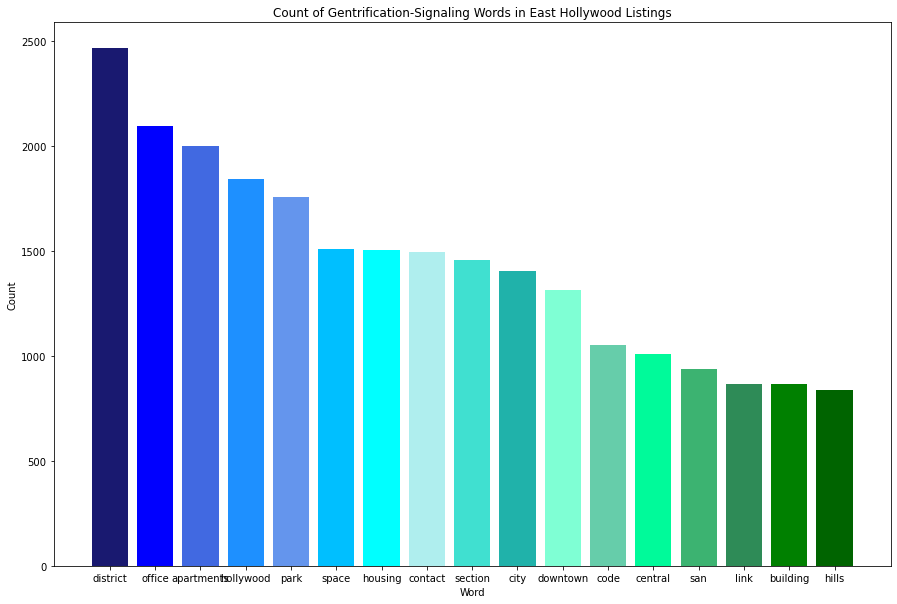

In [75]:
eholly_raw = eholly_raw.reset_index()
plt.figure(figsize=(15,10))
plt.bar(eholly_raw['word'][:30], eholly_raw['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in East Hollywood Listings")
plt.show()

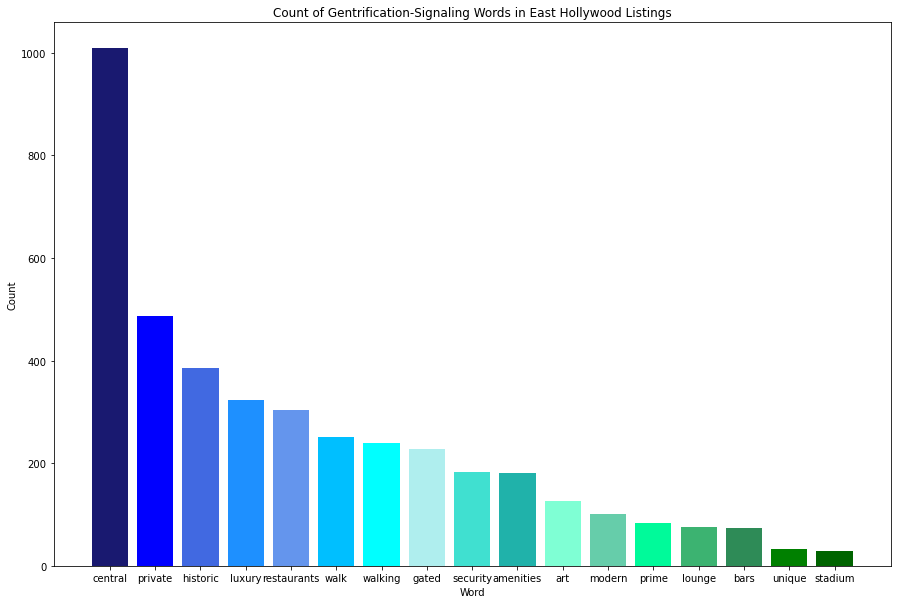

In [71]:
plt.figure(figsize=(15,10))
plt.bar(eholly_g['word'][:17], eholly_g['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in East Hollywood Listings")
plt.show()

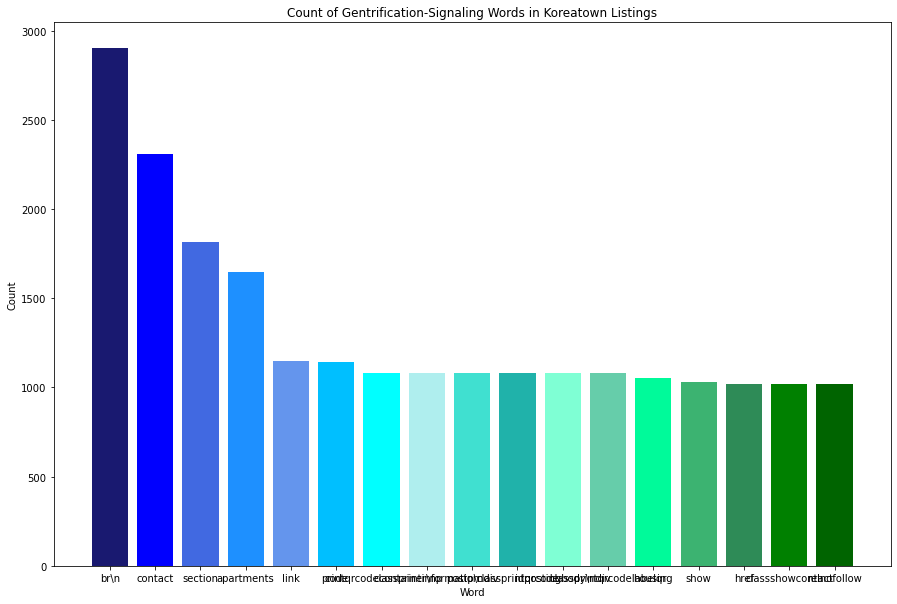

In [81]:
plt.figure(figsize=(15,10))
plt.bar(ktown_raw['word'][:17], ktown_raw['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Koreatown Listings")
plt.show()

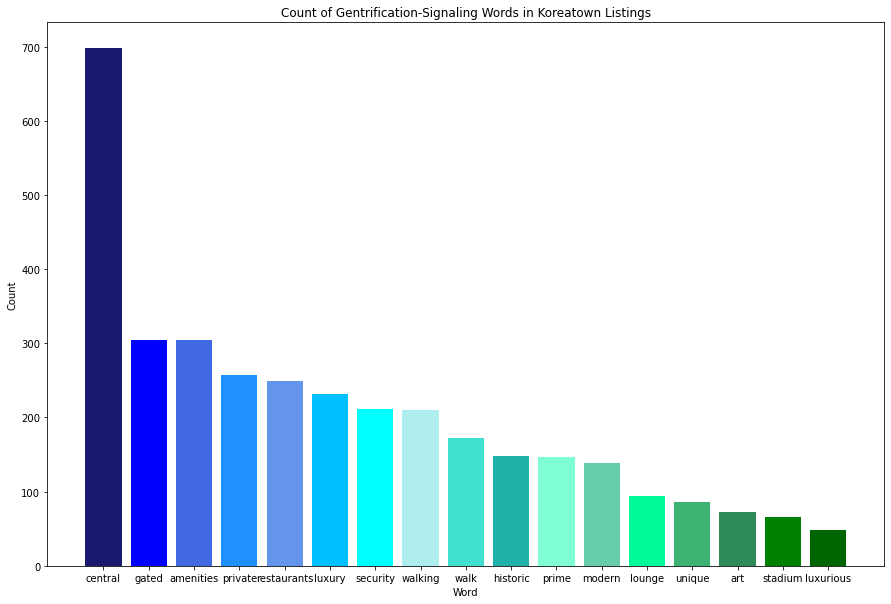

In [39]:
plt.figure(figsize=(15,10))
plt.bar(ktown_g['word'][:17], ktown_g['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Koreatown Listings")
plt.show()

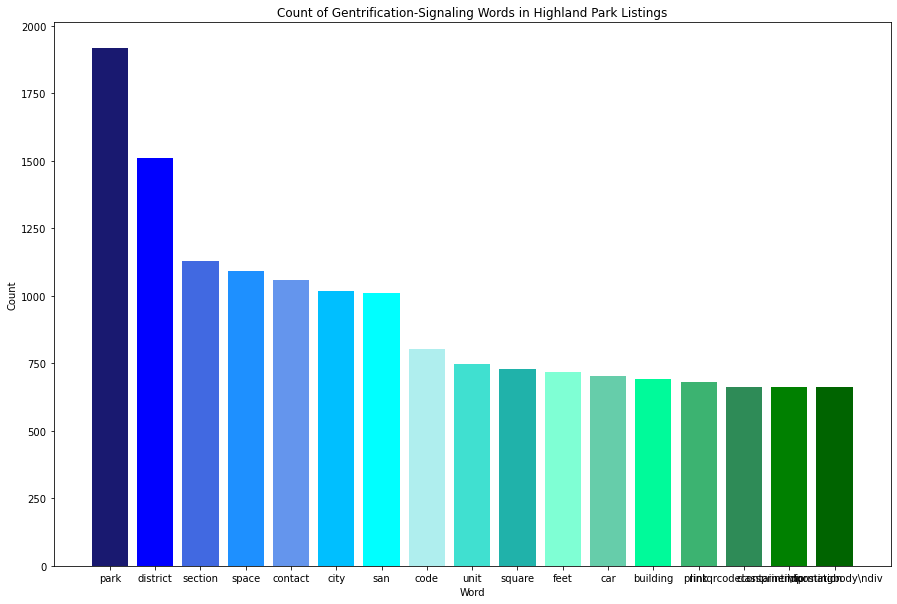

In [84]:
hpark_raw = hpark_raw.reset_index()
plt.figure(figsize=(15,10))
plt.bar(hpark_raw['word'][:17], hpark_raw['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Highland Park Listings")
plt.show()

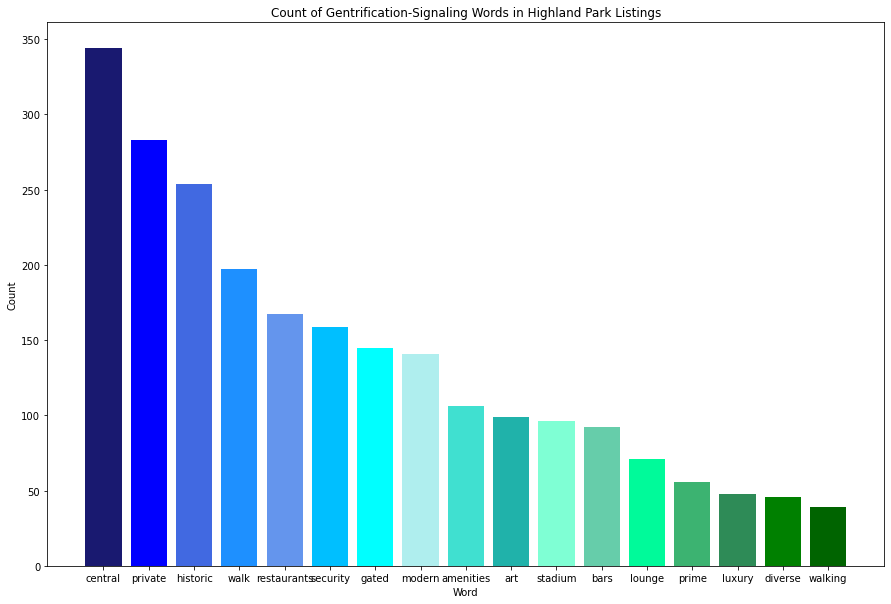

In [40]:
plt.figure(figsize=(15,10))
plt.bar(hpark_g['word'][:17], hpark_g['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Highland Park Listings")
plt.show()

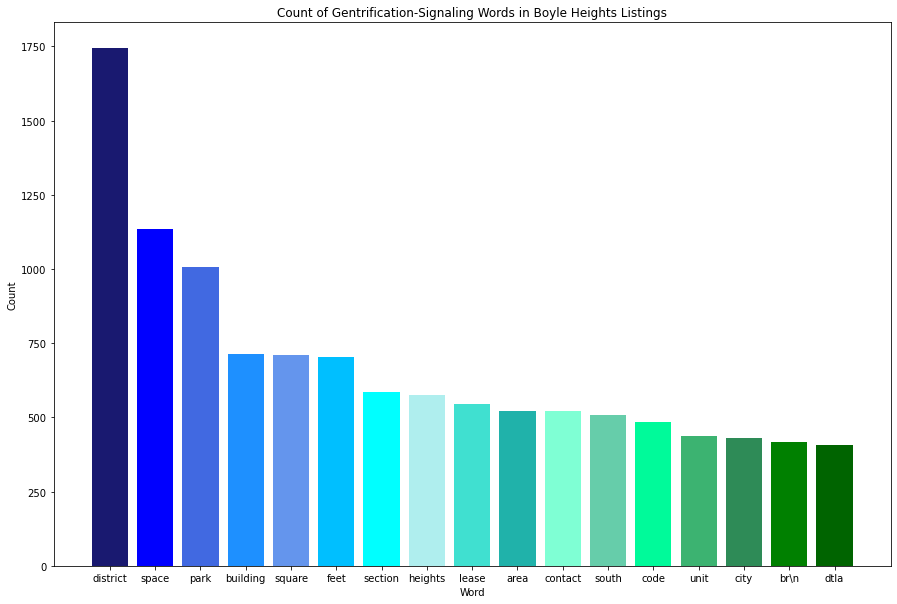

In [85]:
bheights_raw = bheights_raw.reset_index()
plt.figure(figsize=(15,10))
plt.bar(bheights_raw['word'][:17], bheights_raw['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Boyle Heights Listings")
plt.show()

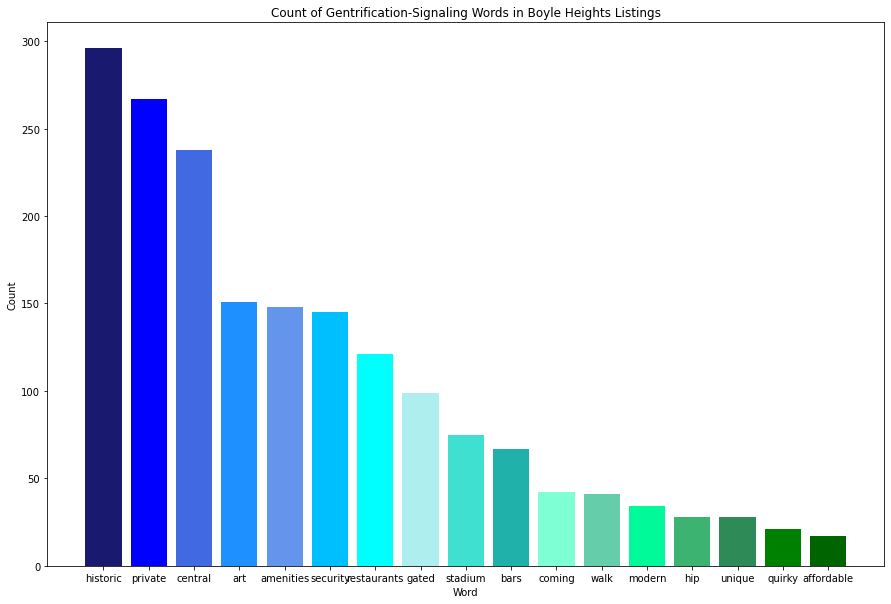

In [41]:
plt.figure(figsize=(15,10))
plt.bar(bheights_g['word'][:17], bheights_g['word_count'][:17], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in Boyle Heights Listings")
plt.show()

# Findings from Notebook 1
In this notebook, we conducted an analysis of the language used in rental listings on craiglist for 4 neighborhoods: East Hollywood, Koreatown, Highland Park, and Boyle Heights. Across these neighborhoods we found that 'park' was among one of the most common words to come up in our raw word count (not filtering for code words). 'Central' also came up as a common word with a high frequency. These two words suggest that the idea of proximity is an attractive feature in these neighborhoods. 'Park' suggests proximity to outdoor amenities, while 'central' suggests general proximity to amenities, services, and other areas of interest. 

In our analysis of gentrification code words appearing in the descriptions of listings, we found that "central" was the most frequent word for East Hollywood, Koreatown, and Highland Park. For each of these neighborhoods, words like "private" and "gated" closely followed, suggesting that the idea of safety and security were of top importance to current and future residents. Boyle Heights, however, was slightly different with the word with highest frequency being "historic." Given that we've identified Boyle Heights as a neighborhood that is in the beginning stages of gentrification with comparatively little gentrifying activity, the word "historic" seems to less so emphasize amenities and central location, but rather the existing charm offered by the neighborhood's history. However, similar to the other neighborhoods, the words that followed include "private" and "central." 